# LATE MALE SAMPLES (> 10 PCW) - CM017, CM019

In [1]:
import scipy.spatial
import scipy.sparse
import anndata
import pandas as pd
import scanpy as sc
import annoy
import numpy as np

In [2]:
def prepare_scaled(adata, min_genes=0):
    sc.pp.filter_cells(adata, min_genes=min_genes)
    #normalise to median
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    sc.pp.scale(adata, max_value=10)

In [3]:
def knn(iss, gex, gex_only, 
        obs_to_take=None, 
        round_counts=True, 
        computation="annoy", 
        neighbours=15
       ):
    #identify the KNN, preparing a (distances, indices) tuple
    if computation == "annoy":
        #build the GEX index
        ckd = annoy.AnnoyIndex(gex.X.shape[1], metric="euclidean")
        for i in np.arange(gex.X.shape[0]):
            ckd.add_item(i,gex.X[i,:])
        ckd.build(10)
        #query the GEX index with the ISS data
        ckdo_ind = []
        ckdo_dist = []
        for i in np.arange(iss.X.shape[0]):
            holder = ckd.get_nns_by_vector(iss.X[i,:], neighbours, include_distances=True)
            ckdo_ind.append(holder[0])
            ckdo_dist.append(holder[1])
        ckdout = (np.asarray(ckdo_dist),np.asarray(ckdo_ind))
    elif computation == "cKDTree":
        #build the GEX index
        ckd = scipy.spatial.cKDTree(gex.X)
        #query the GEX index with the ISS data
        ckdout = ckd.query(x=iss.X, k=neighbours, workers=-1)
    else:
        raise ValueError("Invalid computation, must be 'annoy' or 'cKDTree'")
    #turn KNN output into a scanpy-like graph
    #the indices need to be flattened, the default row-major style works
    indices = ckdout[1].flatten()
    #the indptr is once every neighbours, but needs an extra entry at the end
    indptr = neighbours * np.arange(iss.shape[0]+1)
    #the data is ones. for now. use float32 as that's what scanpy likes as default
    data = np.ones(iss.shape[0]*neighbours, dtype=np.float32)
    #construct the KNN graph!
    #need to specify the shape as there may be cells at the end that don't get picked up
    #and this will throw the dimensions off when doing matrix operations shortly
    pbs = scipy.sparse.csr_matrix((data, indices, indptr), shape=[iss.shape[0], gex.shape[0]])
    #get the annotations and fractions of the specified obs columns in the KNN
    #start the obs pool with what already resides in the ISS object
    pbs_obs = iss.obs.copy()
    if obs_to_take is not None:
        #just in case a single is passed as a string
        if type(obs_to_take) is not list:
            obs_to_take = [obs_to_take]
        #now we can iterate over this nicely
        #using the logic of milopy's annotate_nhoods()
        for anno_col in obs_to_take:
            anno_dummies = pd.get_dummies(gex.obs[anno_col])
            anno_count = pbs.dot(anno_dummies.values)
            #apparently an np.array falls out from the above
            #which then in turn needs [:,None] here for the division to work properly
            anno_frac = np.array(anno_count / anno_count.sum(1)[:,None])
            anno_frac = pd.DataFrame(
                anno_frac,
                index=iss.obs_names,
                columns=anno_dummies.columns,
            )
            pbs_obs[anno_col] = anno_frac.idxmax(1)
            pbs_obs[anno_col + "_fraction"] = anno_frac.max(1)
    #the expression is a mean rather than a sum, make the data to add up to one per row
    pbs.data = (pbs.data / neighbours)
    X = pbs.dot(gex_only.X)
    #round the data to nearest integer if instructed
    if round_counts:
        X.data = np.round(X.data)
        X.eliminate_zeros()
    #now we can build the object easily
    out = anndata.AnnData(X, var=gex_only.var, obs=pbs_obs)
    return out

In [4]:
def patch(iss, gex, 
          min_genes=0, 
          obs_to_take=None, 
          round_counts=True, 
          computation="annoy", 
          neighbours=15
         ):
    """
    Identify the nearest neighbours of low dimensionality observations 
    in related higher dimensionality data. Approximate features absent  
    from the low dimensionality data as high dimensionality neighbour 
    means. The data is log-normalised and z-scored prior to KNN 
    inference.
    
    Input
    -----
    iss : ``AnnData``
        The low dimensionality data object, with raw counts in ``.X``.
    gex : ``AnnData``
        The high dimensionality data object, with raw counts in ``.X``.
    min_genes : ``int``, optional (default: 3)
        Passed to ``scanpy.pp.filter_cells()`` ran on the shared feature 
        space of ``iss`` and ``gex``.
    obs_to_take : ``str`` or list of ``str``, optional (default: ``None``)
        If provided, will report the most common value of the specified 
        ``gex.obs`` column(s) for the neighbours of each ``iss`` cell.
    round_counts : ``bool``, optional (default: ``True``)
        If ``True``, will round the computed counts to the nearest 
        integer.
    computation : ``str``, optional (default: ``"annoy"``)
        The package supports KNN inference via annoy (specify 
        ``"annoy"``) and scipy's cKDTree (specify ``"cKDTree"). Annoy 
        identifies approximate neighbours and runs quicker, cKDTree 
        identifies exact neighbours and is a bit slower.
    neighbours : ``int``, optional (default: 15)
        How many neighbours in ``gex`` to identify for each ``iss`` cell.
    """
    #copy the objects to avoid modifying the originals
    iss = iss.copy()
    gex = gex.copy()
    #subset the ISS to genes that appear in the GEX
    iss = iss[:, [i in gex.var_names for i in iss.var_names]]
    #separate GEX into shared gene space and not shared gene space
    #gex_only = gex[:, [i not in iss.var_names for i in gex.var_names]]
    gex_only = gex.copy()
    gex = gex[:, iss.var_names]
    #turn both objects for KNNing into a log-normalised, z-scored form
    prepare_scaled(iss, min_genes=0)
    prepare_scaled(gex, min_genes=0)
    #this might remove some cells from the GEX, mirror in the gex_only
    gex_only = gex_only[gex.obs_names]
    #identify the KNN and use it to approximate expression
    return knn(iss=iss, 
               gex=gex, 
               gex_only=gex_only, 
               obs_to_take=obs_to_take,
               round_counts=round_counts,
               computation=computation,
               neighbours=neighbours
              )

In [5]:
adata_sc = sc.read('/nfs/team292/vl6/FetalReproductiveTract/males_post10pcw_labeltransfer.h5ad')
CM017 = sc.read('/nfs/team292/vl6/FetalReproductiveTract/ISS/CM017_annotated.h5ad')
CM017.obs_names = ['CM017_' + i for i in CM017.obs_names]
CM019 = sc.read('/nfs/team292/vl6/FetalReproductiveTract/ISS/CM019_annotated.h5ad')
CM019.obs_names = ['CM019_' + i for i in CM019.obs_names]

adata_sc.shape, CM017.shape, CM019.shape

((107124, 28401), (105838, 171), (232077, 171))

In [6]:
CM019.obsm['spatial']

array([[7.00204534e+04, 3.56480406e+01],
       [3.95638041e+04, 3.42853385e+01],
       [5.37326837e+04, 4.39464404e+01],
       ...,
       [2.35894010e+04, 7.84930533e+04],
       [2.14757788e+04, 7.84911238e+04],
       [2.36887292e+04, 7.85056975e+04]])

In [7]:
adata_sp = CM017.concatenate([CM019],
            join='outer',index_unique=None, fill_value=0, uns_merge='unique')

/opt/conda/envs/atac_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/opt/conda/envs/atac_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [8]:
adata_sp.shape # differences between HOX code and original panel

(337915, 175)

In [9]:
adata_sp.obs.head()

,sample,total_counts,n_genes_by_counts,leiden,broad_anatomy,broad_anatomy_number,L2_dist_broad_anatomy_Epididymis,L2_dist_broad_anatomy_Vas Deferens,longitudinal_anatomy,longitudinal_anatomy_number,L2_dist_longitudinal_anatomy_EpididymisEnd,L2_dist_longitudinal_anatomy_EfferentDuctules,L2_dist_longitudinal_anatomy_VasDeferensEnd,L2_dist_longitudinal_anatomy_VasDeferensStart,L2_dist_broad_anatomy_External Genitalia,batch
CM017_1,CM017,39.0,7,2,Unassigned,2,1377.957888,875.420027,Unassigned,6.0,1622.171838,3944.788308,4044.237768,938.569736,NaN,0
CM017_2,CM017,33.0,5,2,Testis,14,1384.172398,865.857098,Unassigned,6.0,1623.469998,3943.180826,4033.793180,930.103497,NaN,0
CM017_3,CM017,36.0,5,2,Testis,14,1384.172398,865.857098,Unassigned,6.0,1623.469998,3943.180826,4033.793180,930.103497,NaN,0
CM017_4,CM017,12.0,2,1,Unassigned,2,1377.957888,875.420027,Unassigned,6.0,1622.171838,3944.788308,4044.237768,938.569736,NaN,0
CM017_5,CM017,10.0,4,6,Testis,14,1384.172398,865.857098,Unassigned,6.0,1623.469998,3943.180826,4033.793180,930.103497,NaN,0


## Remove gonads because they are not in the reference

In [10]:
adata_sp.obs['broad_anatomy'].value_counts(dropna = False)

External Genitalia    206665
Epididymis             65428
Unassigned             26632
Vas Deferens           22181
Testis                 11255
Background              5754
Name: broad_anatomy, dtype: int64

In [13]:
adata_sp = adata_sp[[i not in ['Testis', 'Background', 'Unassigned'] for i in adata_sp.obs['broad_anatomy']]]
adata_sp.shape

(294274, 175)

In [14]:
adata_sc.obs['celltype'].value_counts()

Epididymis Mese          37525
Vas Deferens Lig         14067
Epididymis Lig            6546
Perivascular              4858
Vas Deferens Mese         3859
Prostate SmMu             3464
Endothelial               3247
Glans                     2965
Corpus Cavernosum         2776
Schwann                   2555
Pre-Perivascular          2491
Lower Prostate Mese       2327
Corpus Spongiosum         2314
Upper Prostate Mese       2240
Epididymis Epi            2124
Urethral Epi              2079
Prostate Epi              1988
Prostate Lig              1600
Prepuce                   1364
Vas Deferens Epi          1152
Neural                    1031
Immune                     876
Preputial Lamina           864
Skeletal Muscle            817
Coelomic Epi               592
Surface Genital Epi        508
Müllerian Epi              371
Endothelial Lymphatic      357
Ciliated Epi                97
Erythroid                   70
Name: celltype, dtype: int64

In [15]:
adata_sc = adata_sc[[i not in [
                                                 'Müllerian Epi',
                                                 'Lower Prostate Mese', 
                                                'Upper Prostate Mese', 
                                                'Prostate Epi', 'Prostate Lig', 
                                                'Prostate SmMu', 
                              ] for i in adata_sc.obs['celltype']]]

In [16]:
# Random downsampling per cell type 
import random
from itertools import chain
def downsample(adata, labels, n): 
    
    myindex = adata.obs[labels].value_counts().index 
    myvalues = adata.obs[labels].value_counts().values
    clusters = pd.Series(myvalues, index = myindex)
    
    # Find clusters with > n cells 
    cl2downsample = clusters.index[ clusters.values > n ]

    # save all barcode ids from small clusters
    holder = []
    holder.append( adata.obs_names[[ i not in cl2downsample for i in adata.obs[labels] ]] ) 

    # randomly sample n cells in the cl2downsample
    for cl in cl2downsample:
        print(cl)
        cl_sample = adata[[ i == cl for i in adata.obs[labels]]].obs_names
    
        cl_downsample = random.sample(set(cl_sample), n )
        holder.append(cl_downsample)
    
    # samples to include
    samples = list(chain(*holder))

    # Filter adata_count
    adata = adata[[ i in samples for i in adata.obs_names ]]
    return adata

In [17]:
#adata_sc = downsample(adata_sc, 'celltype', 3000)

In [18]:
#adata_sc.obs['celltype'].value_counts()

In [19]:
len(set(adata_sp.var_names).intersection(adata_sc.var_names))


175

In [20]:
set(adata_sp.var_names)- set(adata_sc.var_names)

set()

In [21]:
out = patch(iss=adata_sp, gex=adata_sc, obs_to_take="celltype")

/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
/opt/conda/envs/atac_env/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)
/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:182: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


In [22]:
out.obsm = adata_sp.obsm

In [23]:
import squidpy as sq

<AxesSubplot: >

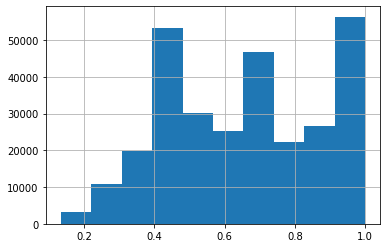

In [24]:
out.obs['celltype_fraction'].hist()

In [24]:
out.obs[['celltype', 'celltype_fraction']].to_csv('/nfs/team292/vl6/FetalReproductiveTract/ISS/male_post10pcw_ISS_deconvolution.csv')

## Visualise ISS specificity for reviewers

<ipython-input-25-da1575d442cf>:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_sp.obs['celltype'] = out.obs['celltype']
/opt/conda/envs/atac_env/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


<AxesSubplot: >

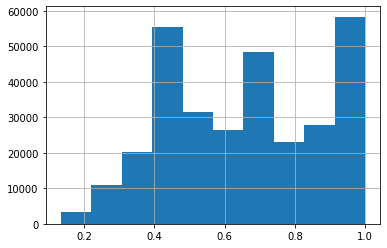

In [25]:
adata_sp.obs['celltype'] = out.obs['celltype']
adata_sp.obs['celltype_fraction'] = out.obs['celltype_fraction']
adata_sp.obs['celltype_fraction'].hist()

In [26]:
adata_sp = adata_sp[[i >= 0.8 for i in adata_sp.obs['celltype_fraction']]]

In [27]:
adata_sp.obs['celltype'].value_counts()

Epididymis Mese          60225
Vas Deferens Lig         10217
Endothelial               7739
Perivascular              7695
Schwann                   3681
Surface Genital Epi       2497
Preputial Lamina          2420
Vas Deferens Mese         2248
Urethral Epi              1837
Epididymis Epi            1759
Glans                     1545
Neural                    1364
Epididymis Lig            1283
Vas Deferens Epi          1119
Immune                    1021
Pre-Perivascular           603
Endothelial Lymphatic      535
Corpus Cavernosum          505
Prepuce                    302
Corpus Spongiosum          256
Coelomic Epi               125
Skeletal Muscle            110
Name: celltype, dtype: int64

In [28]:
a = list(np.unique(adata_sp.obs['celltype']))
b = ['Coelomic Epi', 'Müllerian Epi','Epididymis Epi','Ciliated Epi',
    'Epididymis Mese',  'Epididymis Lig', 'Vas Deferens Epi',
    'Vas Deferens Mese', 'Vas Deferens Lig', 'Prostate Epi', 'Upper Prostate Mese', 'Lower Prostate Mese', 
    'Prostate Lig', 'Prostate SmMu', 'Urethral Epi', 'Surface Genital Epi', 'Preputial Lamina',
    'Glans', 'Corpus Spongiosum', 'Corpus Cavernosum',
    'Prepuce', 
    
    'Pre-Perivascular',
     'Perivascular', 'Skeletal Muscle',  'Endothelial', 'Endothelial Lymphatic',
    'Immune','Erythroid',  'Schwann','Neural']
[i for i in b if i not in a]

['Müllerian Epi',
 'Ciliated Epi',
 'Prostate Epi',
 'Upper Prostate Mese',
 'Lower Prostate Mese',
 'Prostate Lig',
 'Prostate SmMu',
 'Erythroid']

In [29]:
adata_sp.obs['celltype'] = adata_sp.obs['celltype'].astype('category')
adata_sp.obs['celltype'] = adata_sp.obs['celltype'].cat.reorder_categories(
    ['Coelomic Epi', 'Epididymis Epi',
    'Epididymis Mese',  'Epididymis Lig', 'Vas Deferens Epi',
    'Vas Deferens Mese', 'Vas Deferens Lig', 'Urethral Epi', 'Surface Genital Epi', 'Preputial Lamina',
    'Glans', 'Corpus Spongiosum', 'Corpus Cavernosum',
    'Prepuce', 
    
    'Pre-Perivascular',
     'Perivascular', 'Skeletal Muscle',  'Endothelial', 'Endothelial Lymphatic',
    'Immune',  'Schwann','Neural'])

<ipython-input-29-1ffa5bacb9f1>:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_sp.obs['celltype'] = adata_sp.obs['celltype'].astype('category')


In [30]:
np.max(adata_sp.X)

243.0

In [31]:
sc.pp.normalize_total(adata_sp)
sc.pp.log1p(adata_sp)
sc.pp.scale(adata_sp, max_value=10)

In [32]:
np.max(adata_sp.X)

10.0

In [33]:
adata_sp.obs['celltype'].value_counts()

Epididymis Mese          60225
Vas Deferens Lig         10217
Endothelial               7739
Perivascular              7695
Schwann                   3681
Surface Genital Epi       2497
Preputial Lamina          2420
Vas Deferens Mese         2248
Urethral Epi              1837
Epididymis Epi            1759
Glans                     1545
Neural                    1364
Epididymis Lig            1283
Vas Deferens Epi          1119
Immune                    1021
Pre-Perivascular           603
Endothelial Lymphatic      535
Corpus Cavernosum          505
Prepuce                    302
Corpus Spongiosum          256
Coelomic Epi               125
Skeletal Muscle            110
Name: celltype, dtype: int64

In [34]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, 
                         frameon=True, vector_friendly=True, fontsize=14, figsize=[7,7], color_map=None, 
                         format='pdf', facecolor=None, transparent=False,)

In [35]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

In [54]:
markers = ['EMX2', 'PAX8',  'WNT4', 'WNT5A', 'KLK11', 'LRRN4', 'ALDH1A1','MMP7', 'SPAG11B','GLYAT',
            'MYH11','SEMA3D', 'LEFTY1',
          'CTHRC1', 'WNT9B', 'DPP10',
            'CRLF1',  'AGR2', 'CPA6', 'LCN2', 'KRT5', 
           'KRT14', 'TP63', 'DLX5', 'MSX1', 'FOXF1', 'SRD5A2','FOXF2', 'SOX9', 
           'TBX4',  'FOXS1',
           
          'RGS5', 'CDH5', 'PLVAP', 'TFF3', 'LYVE1', 'CD68', 'MPZ', 'PLP1', 'STMN2']

/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


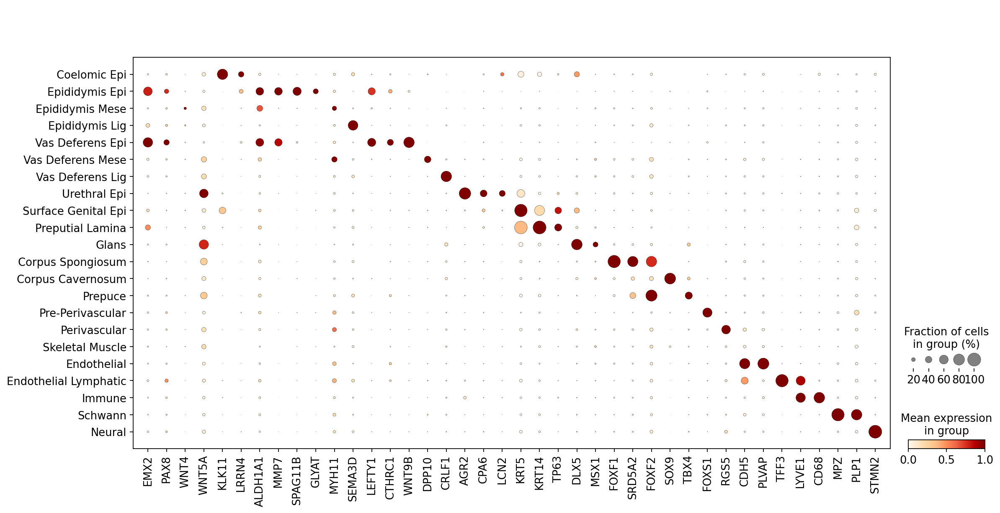

In [55]:
sc.pl.dotplot(adata_sp, var_names = markers, 
              groupby = 'celltype', standard_scale = 'var', color_map = 'OrRd', 
              save = 'iss_specificity_markers_dotplot_>10pcw_male'
             )

## Evaluate cell type proportions per annotated anatomical structure 

In [25]:
out2 = out[[i >= 0.8 for i in out.obs['celltype_fraction']]]

In [26]:
out2.obs['celltype'].value_counts()

Epididymis Mese          57892
Vas Deferens Lig          9889
Perivascular              7515
Endothelial               7465
Schwann                   3611
Surface Genital Epi       2406
Preputial Lamina          2160
Vas Deferens Mese         2158
Urethral Epi              1809
Epididymis Epi            1728
Glans                     1483
Neural                    1308
Epididymis Lig            1234
Vas Deferens Epi          1109
Immune                    1000
Pre-Perivascular           557
Endothelial Lymphatic      520
Corpus Cavernosum          507
Prepuce                    283
Corpus Spongiosum          230
Coelomic Epi               125
Skeletal Muscle            102
Name: celltype, dtype: int64

In [27]:
out2.shape

(105091, 28401)

In [28]:
df_subset = out2.obs[['celltype', 'broad_anatomy']]

In [29]:
df_subset['broad_anatomy'].value_counts()

External Genitalia    66861
Epididymis            30066
Vas Deferens           8164
Name: broad_anatomy, dtype: int64

In [30]:
# Creating pivot table
pivot_df = df_subset.pivot_table(index='broad_anatomy', columns='celltype', aggfunc='size', fill_value=0)

pivot_df.head()

celltype,Coelomic Epi,Corpus Cavernosum,Corpus Spongiosum,Endothelial,Endothelial Lymphatic,Epididymis Epi,Epididymis Lig,Epididymis Mese,Glans,Immune,...,Pre-Perivascular,Prepuce,Preputial Lamina,Schwann,Skeletal Muscle,Surface Genital Epi,Urethral Epi,Vas Deferens Epi,Vas Deferens Lig,Vas Deferens Mese
broad_anatomy,,,,,,,,,,,,,,,,,,,,,
Epididymis,26,49,0,588,42,1540,190,25368,3,135,...,269,0,0,98,1,1,5,746,469,91
External Genitalia,93,399,230,6712,472,49,992,26300,1478,828,...,243,283,2159,3479,101,2405,1795,48,8921,1757
Vas Deferens,6,59,0,165,6,139,52,6224,2,37,...,45,0,1,34,0,0,9,315,499,310


In [31]:
pivot_df.shape

(3, 22)

In [32]:
pivot_df.columns

Index(['Coelomic Epi', 'Corpus Cavernosum', 'Corpus Spongiosum', 'Endothelial',
       'Endothelial Lymphatic', 'Epididymis Epi', 'Epididymis Lig',
       'Epididymis Mese', 'Glans', 'Immune', 'Neural', 'Perivascular',
       'Pre-Perivascular', 'Prepuce', 'Preputial Lamina', 'Schwann',
       'Skeletal Muscle', 'Surface Genital Epi', 'Urethral Epi',
       'Vas Deferens Epi', 'Vas Deferens Lig', 'Vas Deferens Mese'],
      dtype='object', name='celltype')

In [35]:
# Reorder columns
pivot_df = pivot_df[[
    'Epididymis Epi','Epididymis Mese', 'Epididymis Lig','Vas Deferens Epi', 'Vas Deferens Lig', 'Vas Deferens Mese',
    'Preputial Lamina',  'Surface Genital Epi', 'Urethral Epi', 'Glans', 
     'Corpus Cavernosum', 'Corpus Spongiosum',  'Prepuce', 
                    ]]

In [36]:
pivot_df.shape

(3, 13)

In [37]:
pivot_df = pivot_df.reindex(['Epididymis', 'Vas Deferens', 'External Genitalia'])

In [38]:
# Compute the mean and standard deviation for each cell type
mean = pivot_df.mean()
std = pivot_df.std()

# Compute the Z-score for each cell type in each anatomical location
z_scores = (pivot_df - mean) / std


In [39]:
z_scores

celltype,Epididymis Epi,Epididymis Mese,Epididymis Lig,Vas Deferens Epi,Vas Deferens Lig,Vas Deferens Mese,Preputial Lamina,Surface Genital Epi,Urethral Epi,Glans,Corpus Cavernosum,Corpus Spongiosum,Prepuce
broad_anatomy,,,,,,,,,,,,,
Epididymis,1.153027,0.535737,-0.436053,1.068532,-0.580427,-0.694067,-0.577751,-0.57699,-0.579287,-0.576763,-0.602263,-0.577350,-0.577350
Vas Deferens,-0.522690,-1.153724,-0.707929,-0.155216,-0.574268,-0.452156,-0.576949,-0.57771,-0.575412,-0.577937,-0.552074,-0.577350,-0.577350
External Genitalia,-0.630337,0.617986,1.143982,-0.913316,1.154695,1.146223,1.154700,1.15470,1.154698,1.154700,1.154337,1.154701,1.154701


In [40]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

In [41]:
import seaborn as sns 

In [42]:
import matplotlib.pyplot as plt

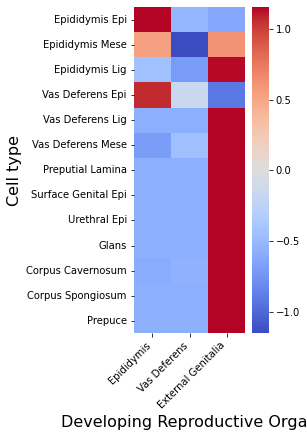

In [46]:
fig, ax = plt.subplots(figsize=(2.5, 6))         # Sample figsize in inches
g = sns.heatmap(z_scores.transpose(), cmap='coolwarm', #annot=True, 
            # fmt='.1f', 
            ax = ax)

g.set_xlabel('Developing Reproductive Organ', fontsize=16)
g.set_ylabel('Cell type', fontsize=16)
g.set_xticklabels(g.get_xticklabels(), rotation=45,  ha='right')

fig = g.get_figure()
fig.savefig("_ISS_more10pcw_male_abundance_per_anatomy.pdf", bbox_inches='tight')
plt.show()

In [49]:
# Read in VISIUM predictions
visium_df = pd.read_csv('/nfs/team292/vl6/FetalReproductiveTract/VISIUM/male_10xvisium_deconvolution.csv', 
                       index_col = 0)
visium_df.head()

,Coelomic Epi,Epididymis Epi,Ciliated Epi,Epididymis Mese,Epididymis Lig,Vas Deferens Epi,Vas Deferens Lig,Vas Deferens Mese,Urethral Epi,Surface Genital Epi,Preputial Lamina,Glans,Corpus Spongiosum,Corpus Cavernosum,Prepuce
broad_anatomy_annots,,,,,,,,,,,,,,,
Epididymis,1.153334,1.150930,1.154244,1.154698,1.110881,1.113912,1.027116,-0.236474,-0.576811,-0.573346,-0.571067,-0.549814,-0.576381,-0.575336,-0.578395
Vas Deferens,-0.528039,-0.656216,-0.605234,-0.575096,-0.282571,-0.293516,-0.970476,1.097042,-0.577889,-0.581345,-0.583611,-0.604456,-0.578319,-0.579363,-0.576305
External Genitalia,-0.625295,-0.494713,-0.549010,-0.579601,-0.828310,-0.820395,-0.056640,-0.860569,1.154700,1.154691,1.154678,1.154270,1.154700,1.154698,1.154700


In [50]:
z_scores

celltype,Epididymis Epi,Epididymis Mese,Epididymis Lig,Vas Deferens Epi,Vas Deferens Lig,Vas Deferens Mese,Preputial Lamina,Surface Genital Epi,Urethral Epi,Glans,Corpus Cavernosum,Corpus Spongiosum,Prepuce
broad_anatomy,,,,,,,,,,,,,
Epididymis,1.153027,0.535737,-0.436053,1.068532,-0.580427,-0.694067,-0.577751,-0.57699,-0.579287,-0.576763,-0.602263,-0.577350,-0.577350
Vas Deferens,-0.522690,-1.153724,-0.707929,-0.155216,-0.574268,-0.452156,-0.576949,-0.57771,-0.575412,-0.577937,-0.552074,-0.577350,-0.577350
External Genitalia,-0.630337,0.617986,1.143982,-0.913316,1.154695,1.146223,1.154700,1.15470,1.154698,1.154700,1.154337,1.154701,1.154701


In [51]:
# Concatenate DataFrames vertically and then horizontally
combined_df = pd.concat([z_scores, visium_df], axis=0, sort=False).groupby(level=0).mean()

combined_df

,Epididymis Epi,Epididymis Mese,Epididymis Lig,Vas Deferens Epi,Vas Deferens Lig,Vas Deferens Mese,Preputial Lamina,Surface Genital Epi,Urethral Epi,Glans,Corpus Cavernosum,Corpus Spongiosum,Prepuce,Coelomic Epi,Ciliated Epi
Epididymis,1.151978,0.845217,0.337414,1.091222,0.223345,-0.465270,-0.574409,-0.575168,-0.578049,-0.563289,-0.588799,-0.576866,-0.577872,1.153334,1.154244
External Genitalia,-0.562525,0.019192,0.157836,-0.866856,0.549028,0.142827,1.154689,1.154696,1.154699,1.154485,1.154518,1.154700,1.154700,-0.625295,-0.549010
Vas Deferens,-0.589453,-0.864410,-0.495250,-0.224366,-0.772372,0.322443,-0.580280,-0.579528,-0.576651,-0.591196,-0.565718,-0.577834,-0.576828,-0.528039,-0.605234


In [52]:
b = ['Epididymis Epi', 'Ciliated Epi', 
                        'Epididymis Mese', 'Epididymis Lig', 'Vas Deferens Epi',  'Vas Deferens Lig','Vas Deferens Mese', 
                        'Urethral Epi', 'Surface Genital Epi', 'Preputial Lamina', 
                        'Glans', 'Corpus Spongiosum', 'Corpus Cavernosum', 'Prepuce']

In [53]:
a = ['Epididymis', 'Vas Deferens', 'External Genitalia']

In [54]:
combined_df_reordered = combined_df.reindex(index=a, columns=b)

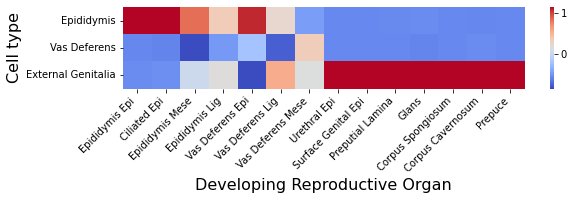

In [56]:
# Plot combined z-scores 
fig, ax = plt.subplots(figsize=(9, 1.5))         # Sample figsize in inches
g = sns.heatmap(combined_df_reordered, cmap='coolwarm', #annot=True, 
            # fmt='.1f', 
            ax = ax)

g.set_xlabel('Developing Reproductive Organ', fontsize=16)
g.set_ylabel('Cell type', fontsize=16)
g.set_xticklabels(g.get_xticklabels(), rotation=45,  ha='right')

fig = g.get_figure()
fig.savefig("_ISS+VISIUM_maleabove10pcw_abundance_per_anatomy_horizontal.pdf", bbox_inches='tight')
plt.show()

In [26]:
out.obs.head()

,sample,total_counts,n_genes_by_counts,leiden,broad_anatomy,broad_anatomy_number,L2_dist_broad_anatomy_Epididymis,L2_dist_broad_anatomy_Vas Deferens,longitudinal_anatomy,longitudinal_anatomy_number,L2_dist_longitudinal_anatomy_EpididymisEnd,L2_dist_longitudinal_anatomy_EfferentDuctules,L2_dist_broad_anatomy_External Genitalia,batch,n_genes,celltype,celltype_fraction
CM017_6484,CM017,21.0,9,7,Vas Deferens,11,577.190834,13.042308,ToExclude,5.0,1317.269024,3524.705096,NaN,0,9,Corpus/CaputEpididymis_Mesenchyme,0.933333
CM017_6534,CM017,34.0,6,20,Vas Deferens,11,583.987478,12.670898,ToExclude,5.0,1318.822477,3525.056567,NaN,0,6,Coelomic_Epithelium,1.000000
CM017_6543,CM017,13.0,4,10,Vas Deferens,11,577.190834,13.042308,ToExclude,5.0,1317.269024,3524.705096,NaN,0,4,Corpus/CaputEpididymis_Mesenchyme,0.333333
CM017_6596,CM017,43.0,6,2,Vas Deferens,11,560.972918,13.028333,ToExclude,5.0,1303.099003,3511.147050,NaN,0,6,Corpus/CaputEpididymis_Mesenchyme,0.666667
CM017_6609,CM017,12.0,3,0,Vas Deferens,11,577.190834,13.042308,ToExclude,5.0,1317.269024,3524.705096,NaN,0,3,Corpus/CaputEpididymis_Mesenchyme,0.800000


In [38]:
for s in [CM017, CM019]: 
    s.obs['celltype'] = s.obs_names.map(out.obs['celltype'].to_dict())
    s.obs['celltype'] = s.obs['celltype'].astype('str')
    s.obs['celltype_fraction'] = s.obs_names.map(out.obs['celltype_fraction'].to_dict())

## CM017

In [39]:
CM017.obs['celltype'].value_counts()

Epididymis Mese          67440
Epididymis Lig            7178
nan                       6974
Vas Deferens Lig          6475
Pre-Perivascular          4789
Epididymis Epi            3102
Vas Deferens Mese         2742
Vas Deferens Epi          1746
Endothelial               1341
Perivascular              1266
Corpus Cavernosum          703
Neural                     450
Schwann                    428
Immune                     417
Coelomic Epi               247
Endothelial Lymphatic      125
Glans                       96
Corpus Spongiosum           73
Prepuce                     69
Surface Genital Epi         67
Skeletal Muscle             63
Urethral Epi                35
Preputial Lamina            11
Ciliated Epi                 1
Name: celltype, dtype: int64

Ciliated Epi
Coelomic Epi
Corpus Cavernosum
Corpus Spongiosum
Endothelial
Endothelial Lymphatic
Epididymis Epi
Epididymis Lig


/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _

Epididymis Mese
Glans


/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


Immune
Neural
Perivascular
Pre-Perivascular
Prepuce


/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _

Preputial Lamina
Schwann
Skeletal Muscle
Surface Genital Epi
Urethral Epi
Vas Deferens Epi
Vas Deferens Lig
Vas Deferens Mese


/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _

nan


/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


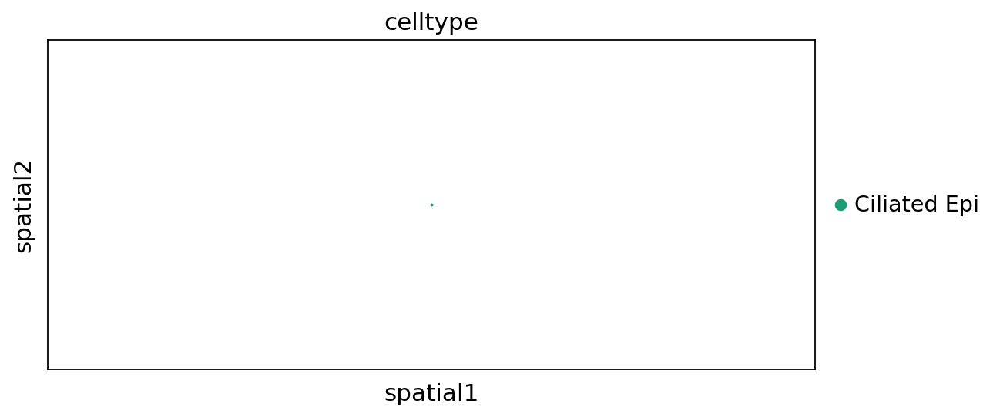

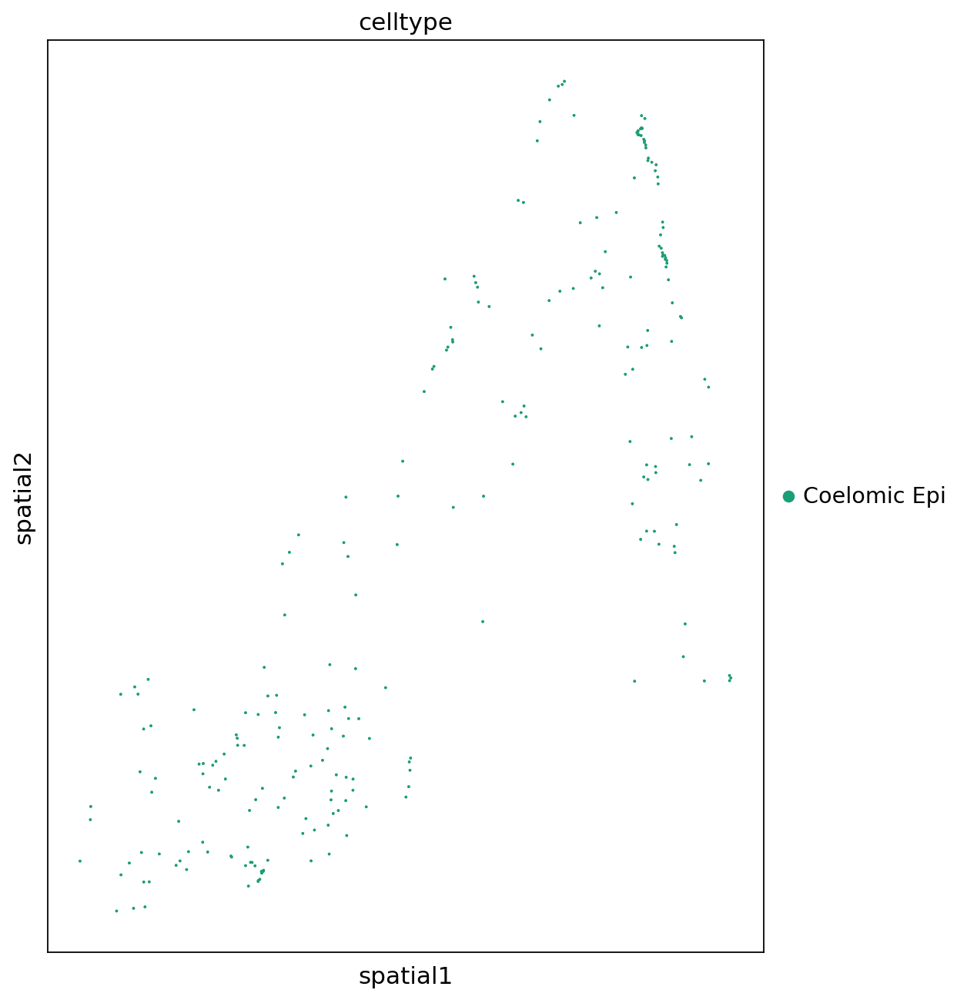

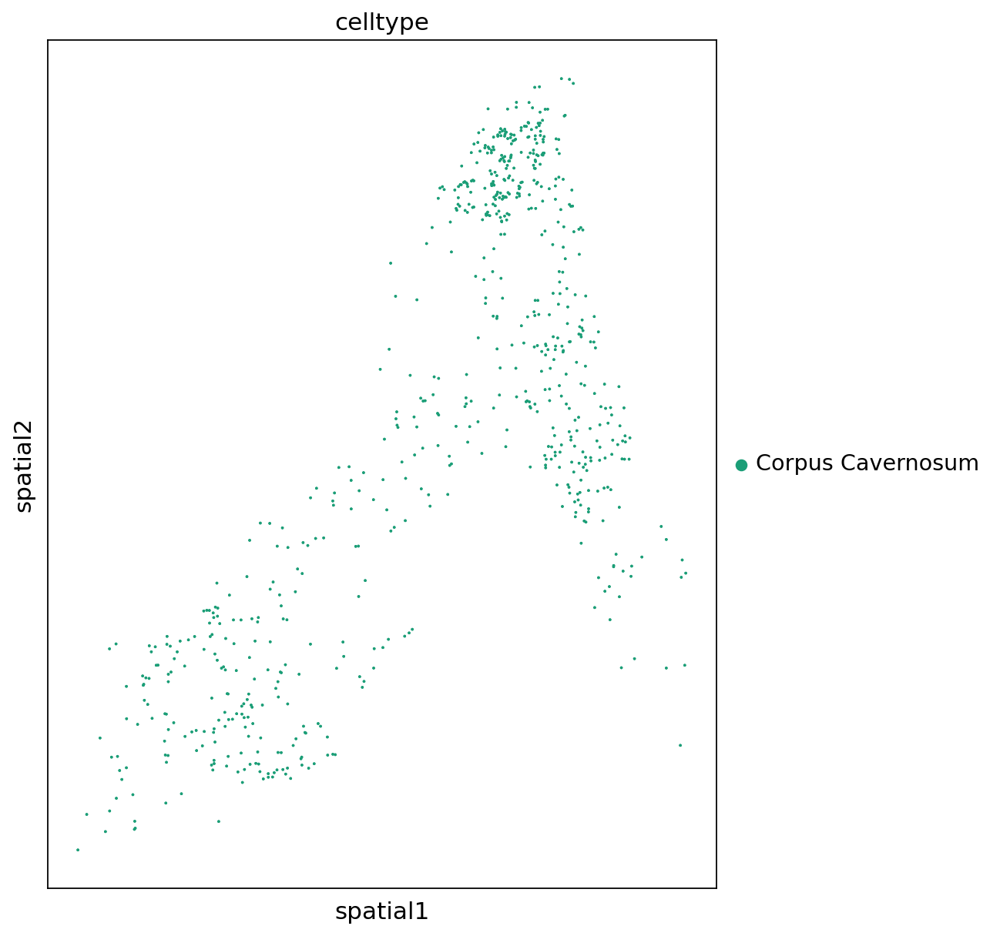

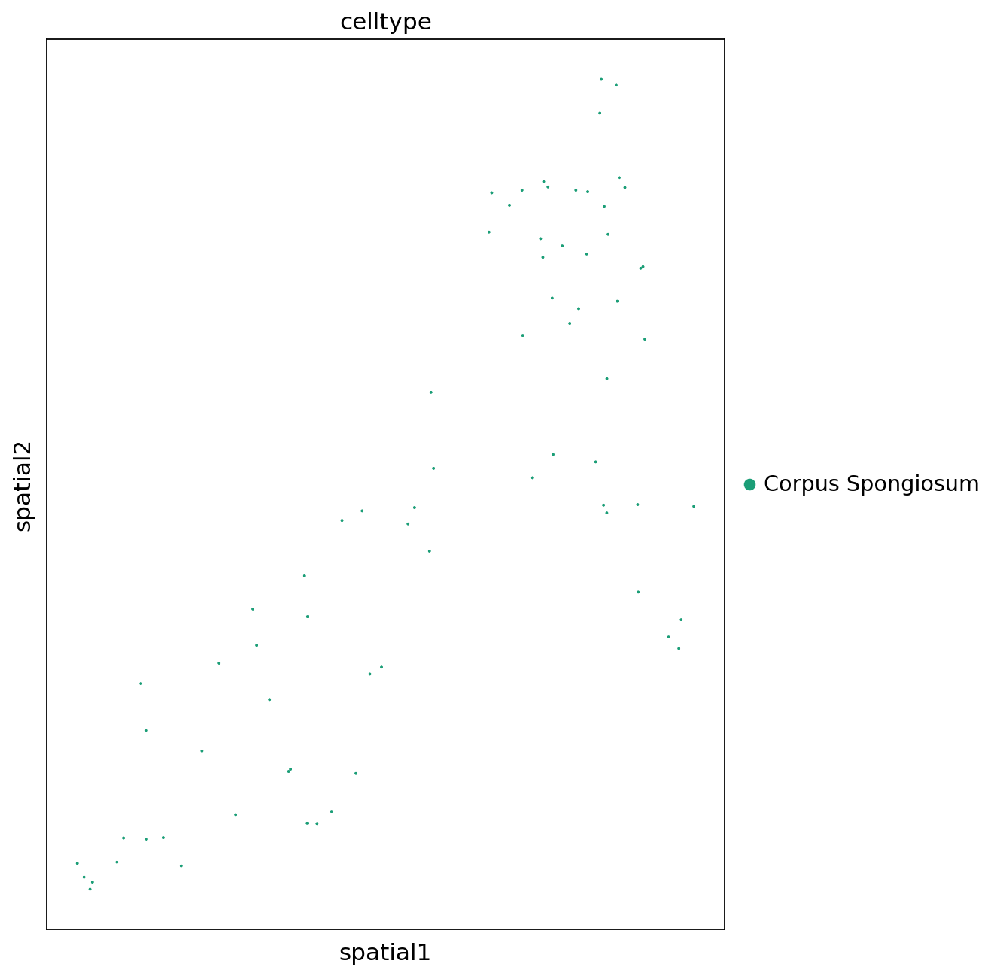

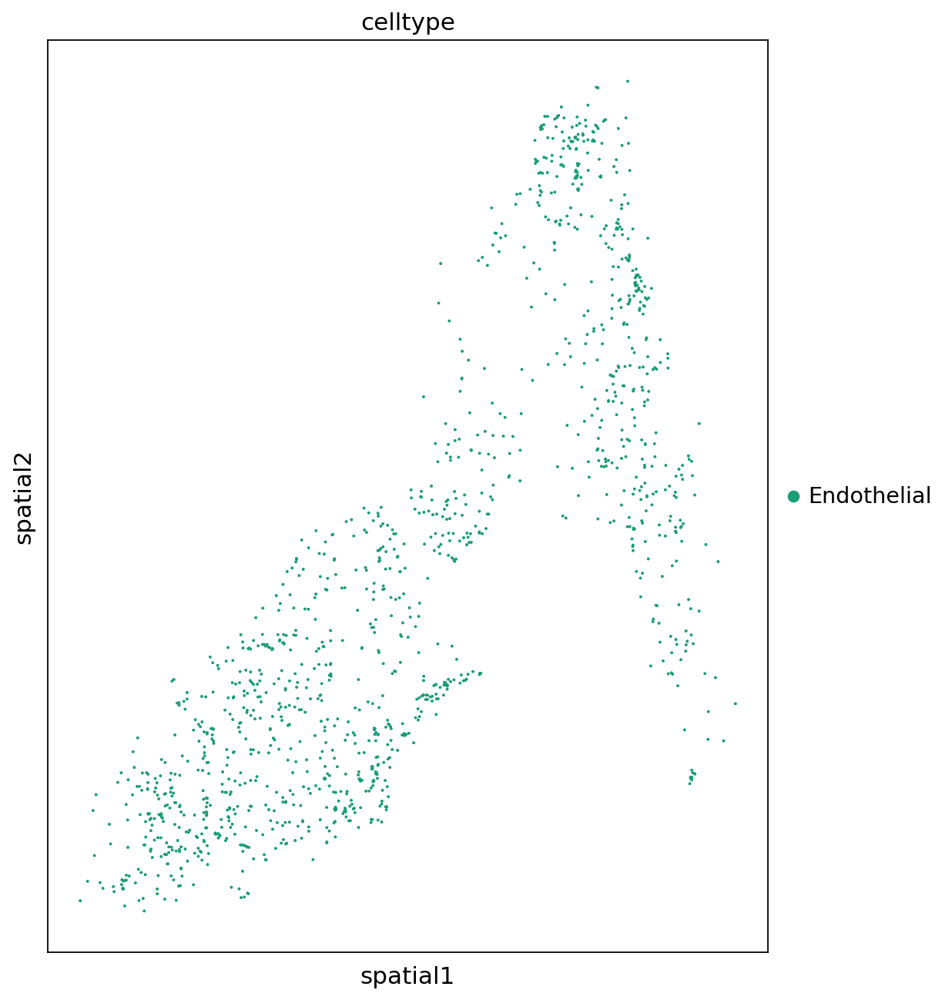

...

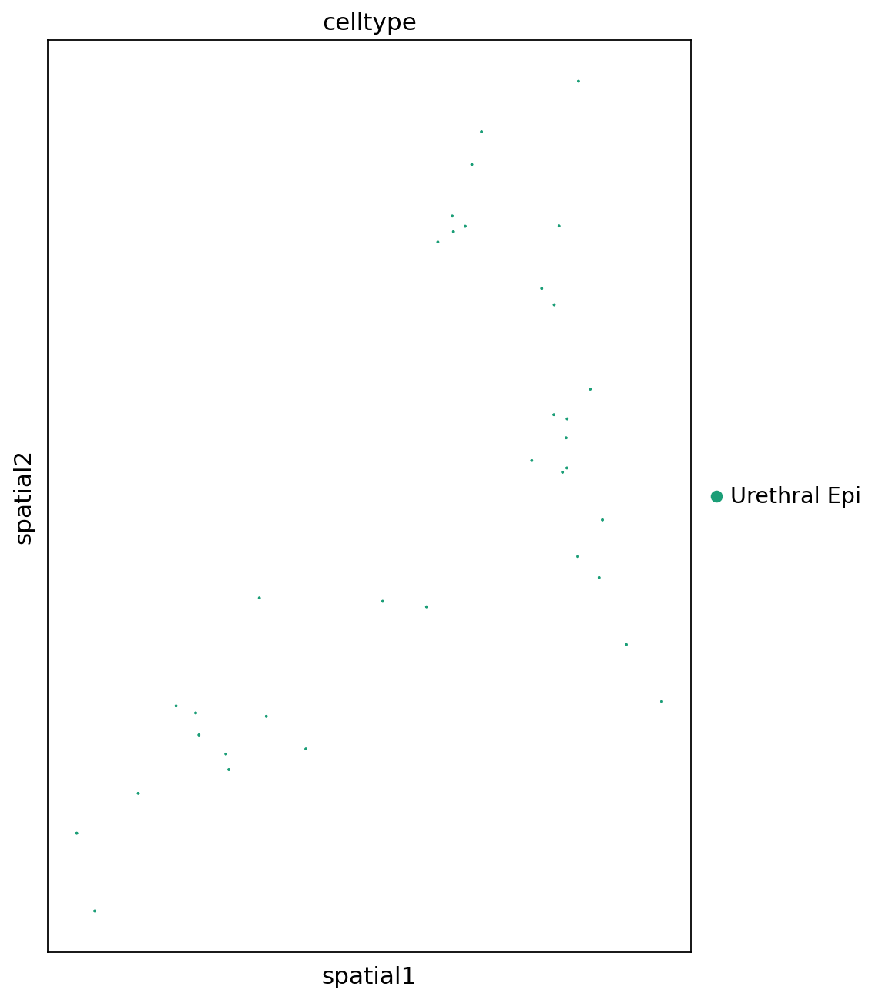

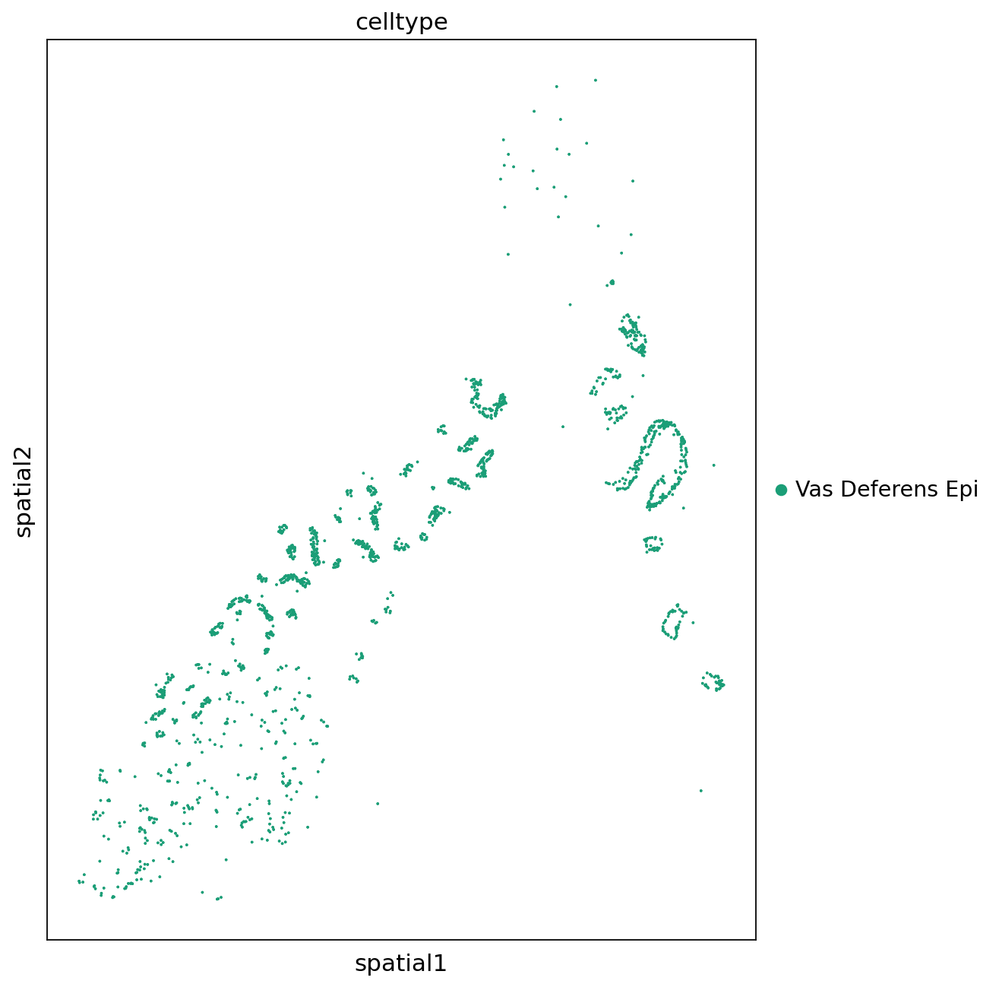

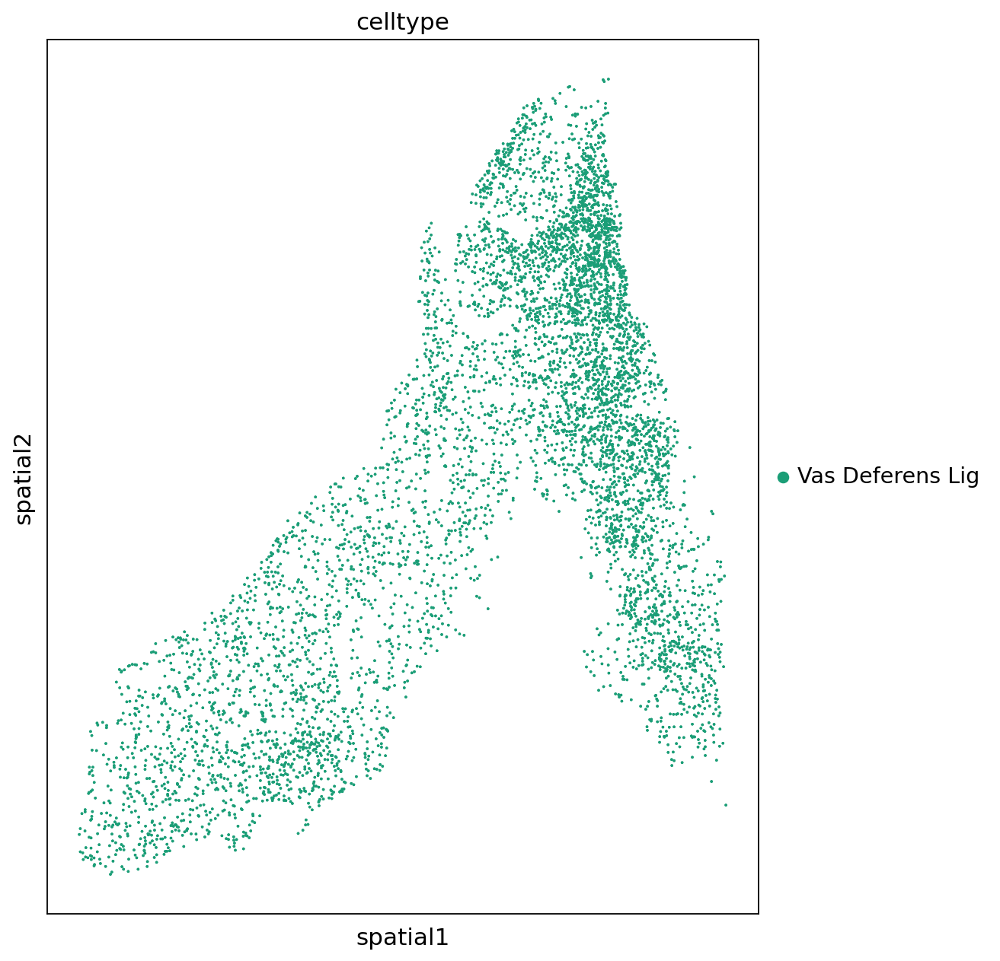

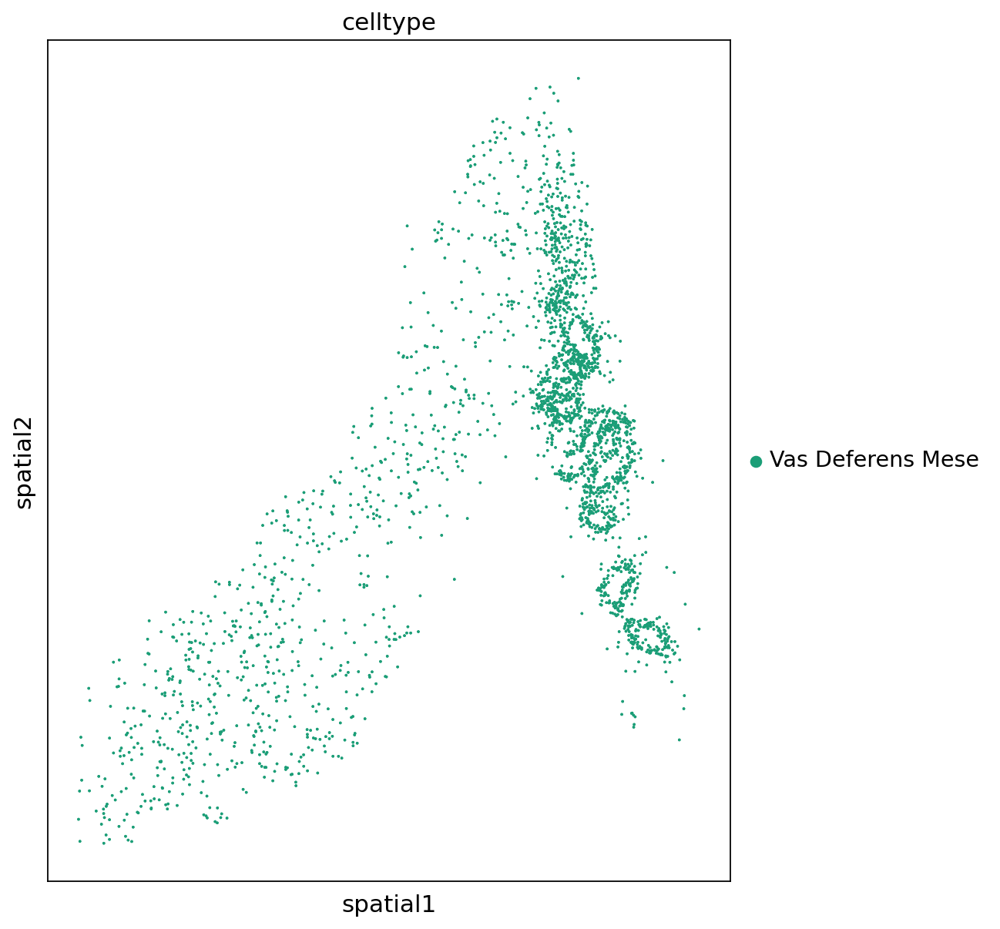

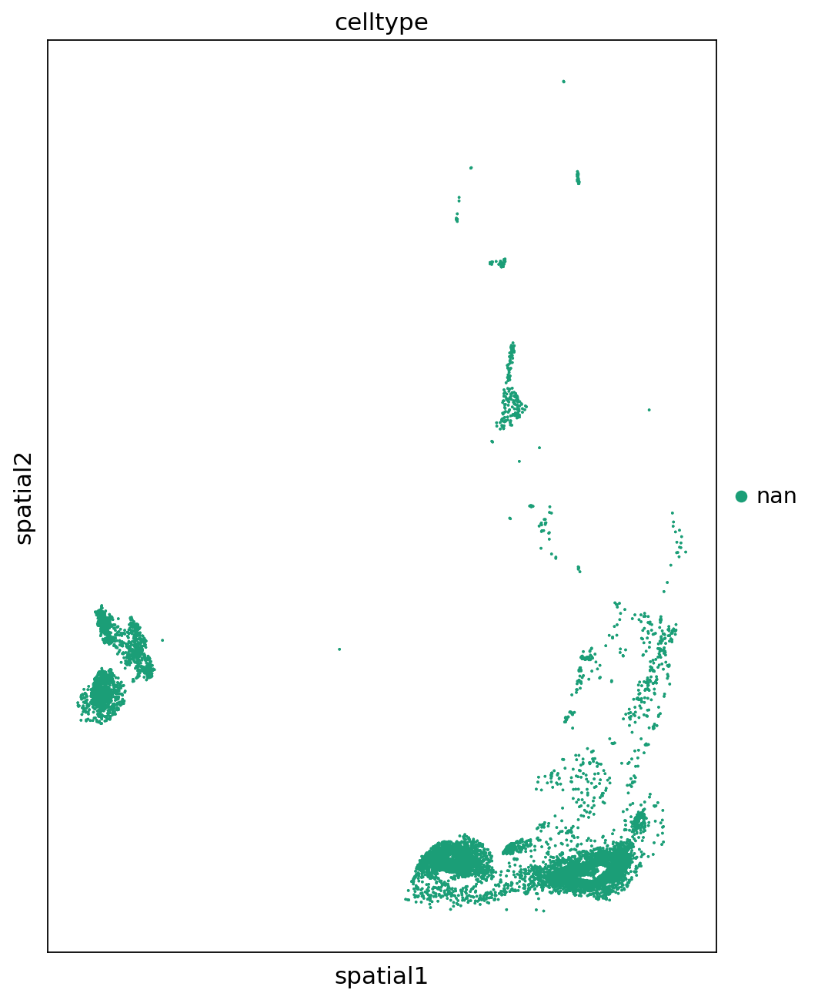

In [40]:
for i in np.unique(CM017.obs['celltype']):
    print(i)
    sq.pl.spatial_scatter(
    CM017,
    spatial_key="spatial",
    color=['celltype'],
    shape=None,
    use_raw = False,
    size=1.5,
    cmap = 'jet',
    figsize=(8,8), 
    legend_loc = 'right margin',
    palette = 'Dark2',
    groups = i
    )

In [50]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, 
                         frameon=True, vector_friendly=True, fontsize=14, figsize=[7,7], color_map=None, 
                         format='pdf', facecolor=None, transparent=False,)

In [51]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

In [42]:
np.unique(CM017.obs['celltype'])

array(['Ciliated Epi', 'Coelomic Epi', 'Corpus Cavernosum',
       'Corpus Spongiosum', 'Endothelial', 'Endothelial Lymphatic',
       'Epididymis Epi', 'Epididymis Lig', 'Epididymis Mese', 'Glans',
       'Immune', 'Neural', 'Perivascular', 'Pre-Perivascular', 'Prepuce',
       'Preputial Lamina', 'Schwann', 'Skeletal Muscle',
       'Surface Genital Epi', 'Urethral Epi', 'Vas Deferens Epi',
       'Vas Deferens Lig', 'Vas Deferens Mese', 'nan'], dtype=object)

In [47]:
# Create a new column based on conditions
def new_column(row):
    if (row['celltype'] in ['Epididymis Epi',  'Vas Deferens Epi',
      
                            
                             ]) and (row['celltype_fraction'] > 0.8):
        return row['celltype']
    else:
        return np.nan

CM017.obs['ducts'] = CM017.obs.apply(new_column, axis=1)


In [48]:
CM017.obs['ducts'].value_counts(dropna=False)

NaN                 103057
Epididymis Epi        1710
Vas Deferens Epi      1071
Name: ducts, dtype: int64

In [49]:
CM017.obs['ducts'] = CM017.obs['ducts'].astype(str)

/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


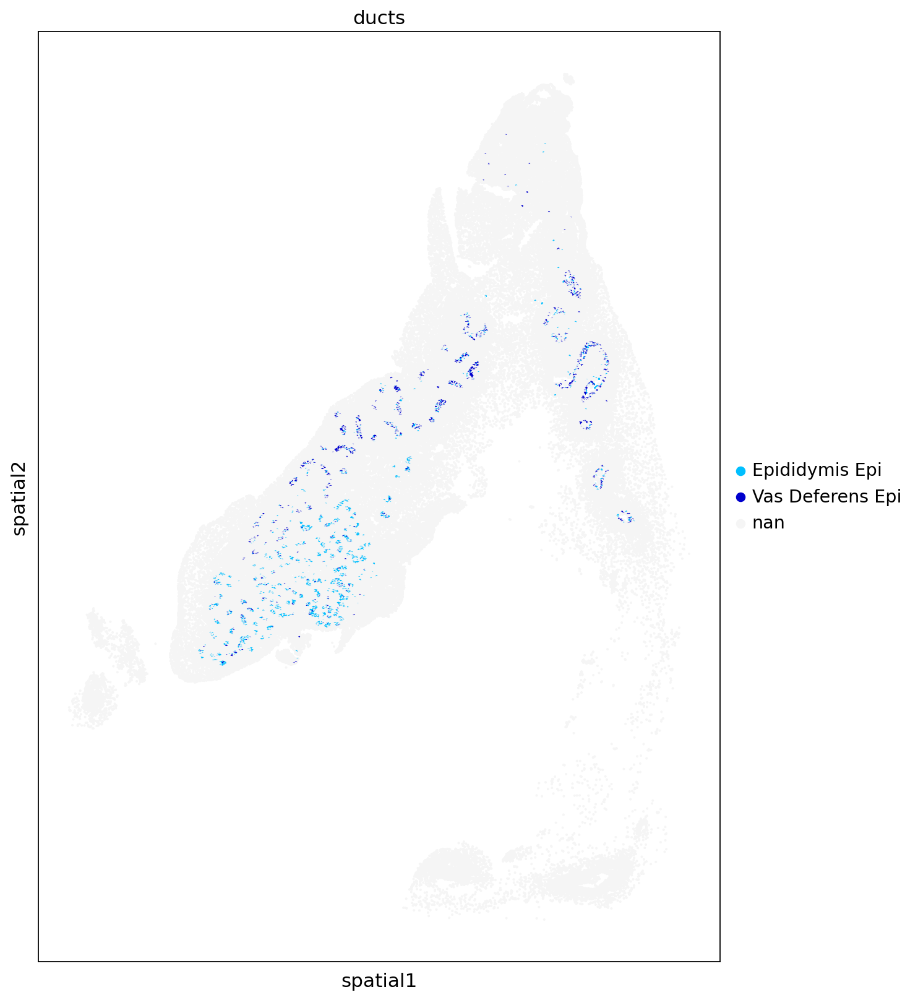

In [54]:
sq.pl.spatial_scatter(
    CM017,
    spatial_key="spatial",
    color=['ducts'],
    shape=None,
    use_raw = False,
    size=1.5,
    cmap = 'jet',
    figsize=(10,10), 
#     legend_loc = 'right margin',
#                     palette= {'Epididymis Epi' : 'deepskyblue',  
#                               'Vas Deferens Epi' : 'mediumblue', 
          
#        'nan' : 'whitesmoke'
#                              },
    save = 'CM017_ducts_filtered.pdf'
)

In [66]:
CM017.obs['broad_anatomy'].value_counts()

Epididymis      68002
Vas Deferens    23408
Unassigned       9173
Background       5255
Name: broad_anatomy, dtype: int64

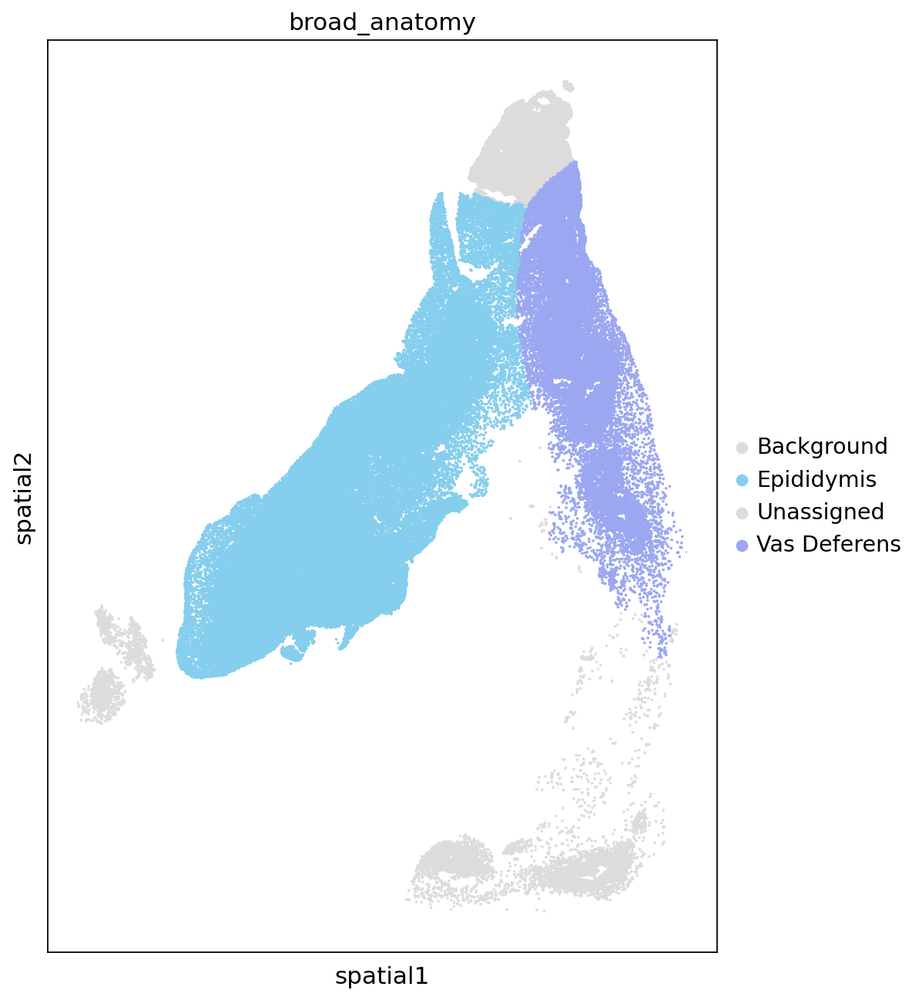

In [69]:
sq.pl.spatial_scatter(
    CM017,
    spatial_key="spatial",
    color=['broad_anatomy'],
    shape=None,
    use_raw = False,
    size=1,
    cmap = 'jet',
    figsize=(8,8), 
           # legend_loc = 'right margin',
           #                   palette= {'Epididymis' : '#86ceed',   
           #                             'Vas Deferens' : '#9ba7f0', 
                                       
           #      'Unassigned' : 'gainsboro', 'Background' : 'gainsboro',
           #                            },
    save = 'CM017_ducts_anatomy.pdf'
)

Coelomic Epi
Corpus Cavernosum
Corpus Spongiosum
Endothelial
Endothelial Lymphatic
Epididymis Epi


/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _

Epididymis Lig
Epididymis Mese


/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


Glans
Immune
Neural
Perivascular
Pre-Perivascular


/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _

Prepuce
Preputial Lamina
Schwann
Skeletal Muscle
Surface Genital Epi
Urethral Epi
Vas Deferens Epi


/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _

Vas Deferens Lig
Vas Deferens Mese
nan


/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:817: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize, dpi=dpi, constrained_layout=True)
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colorm

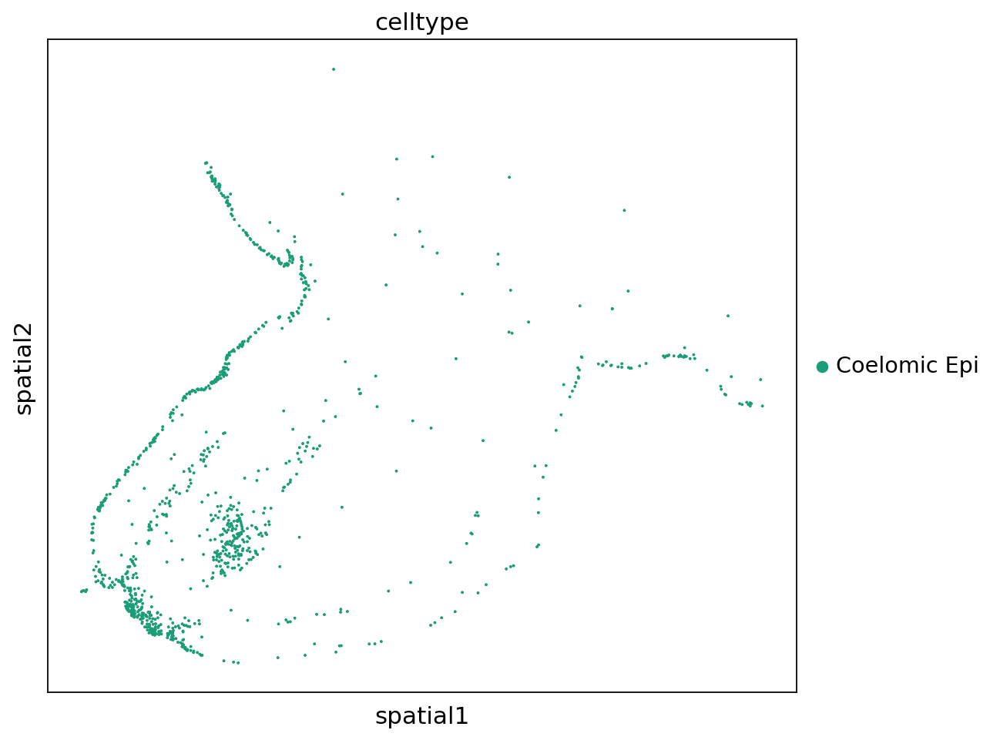

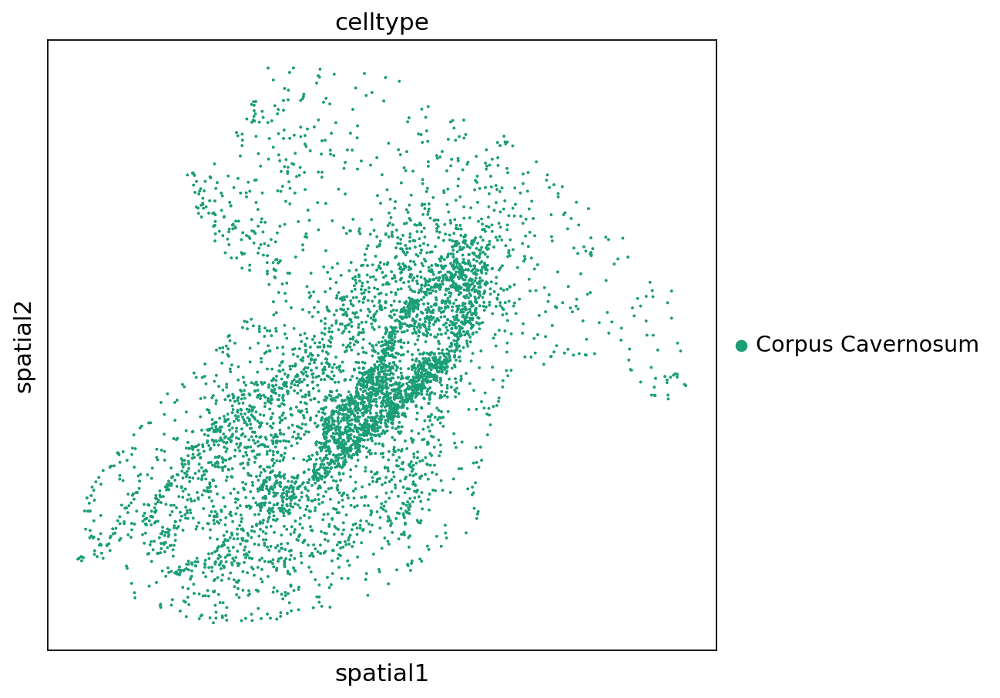

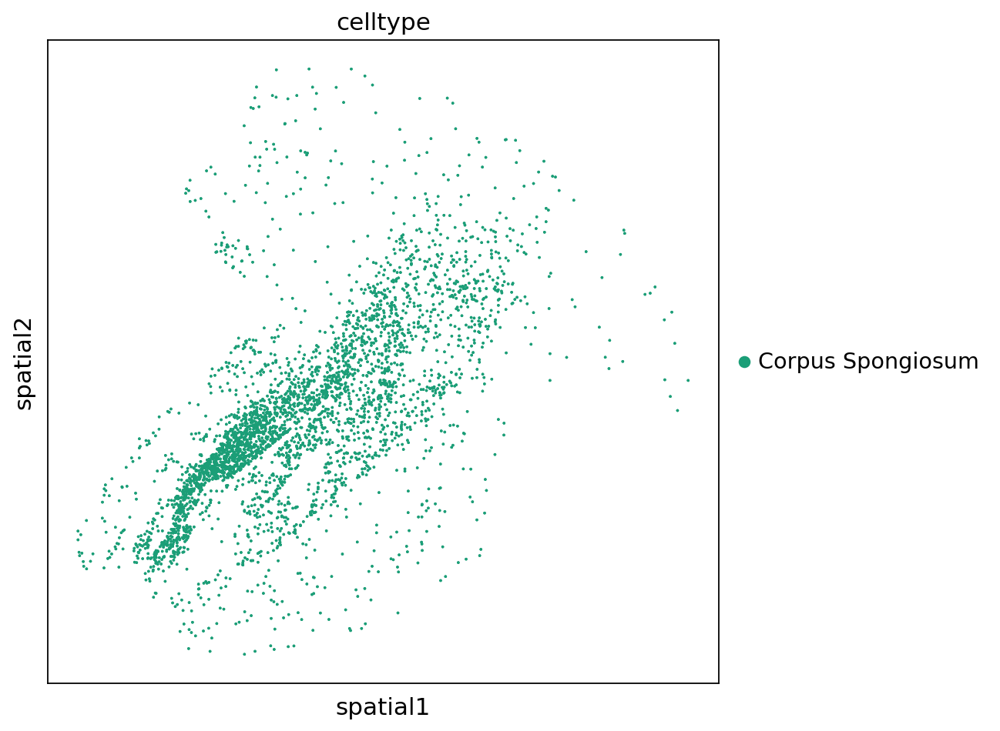

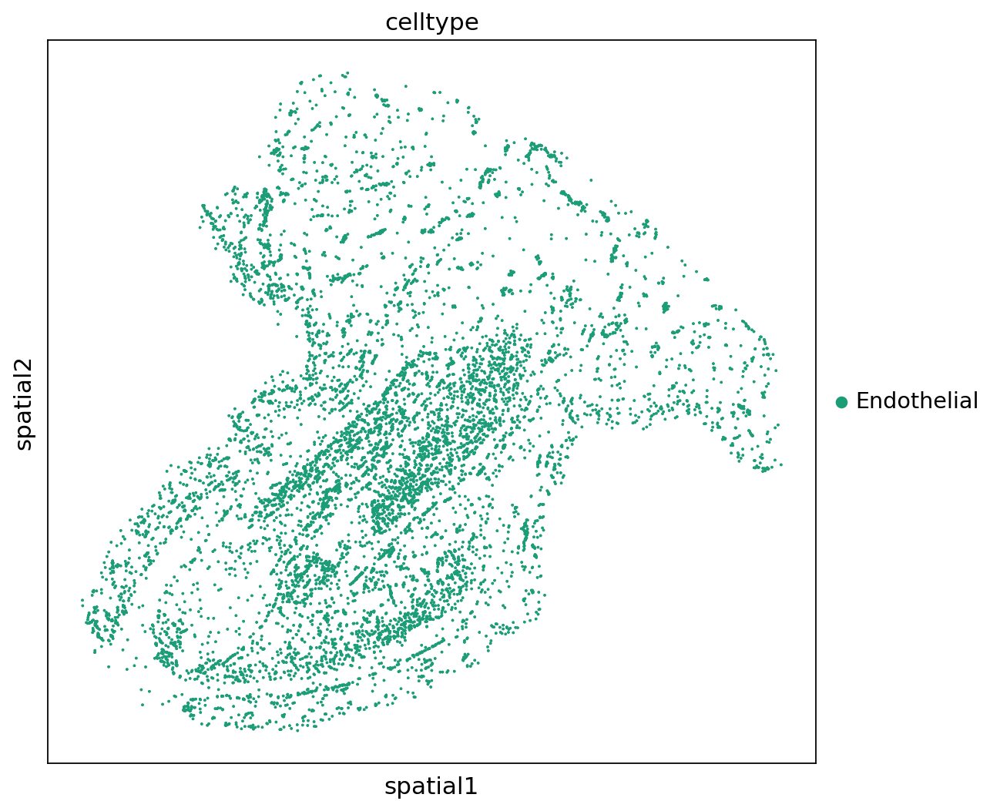

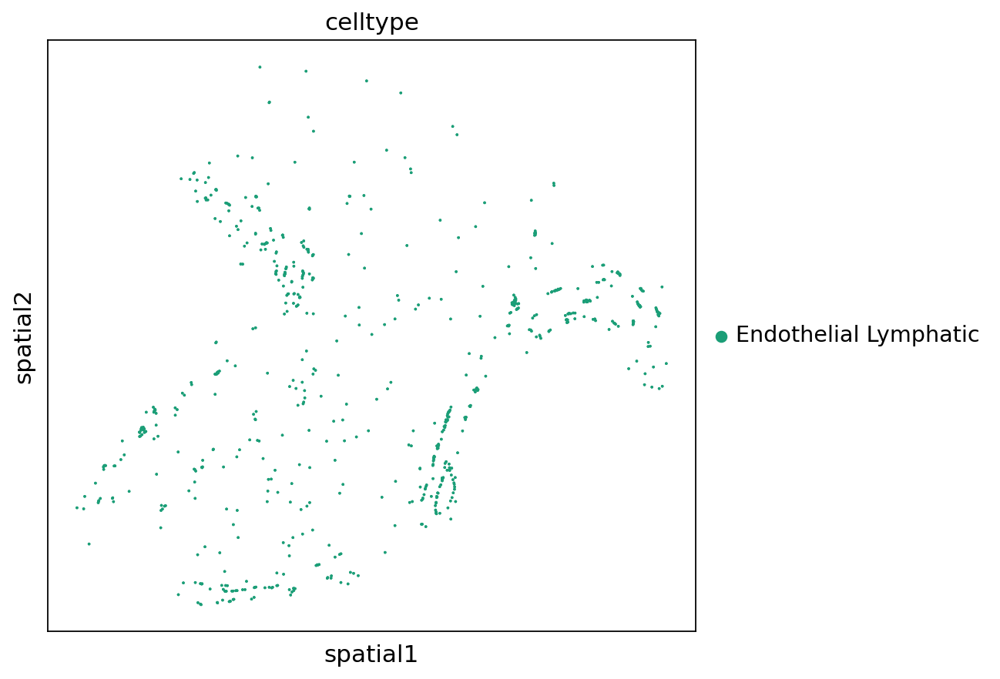

...

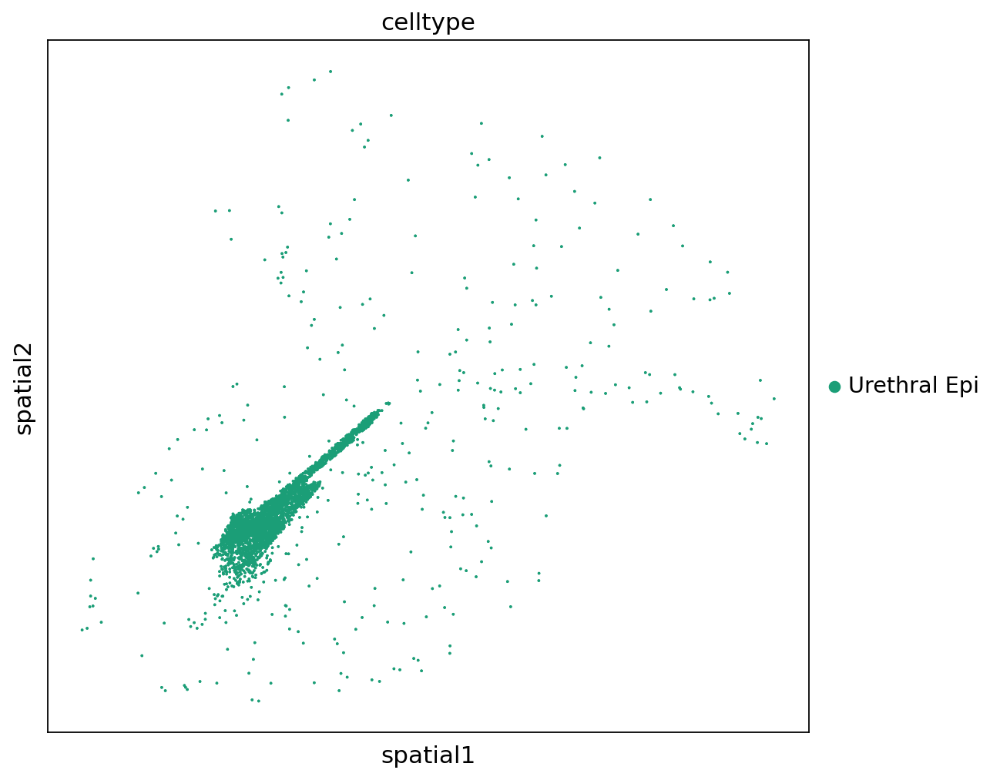

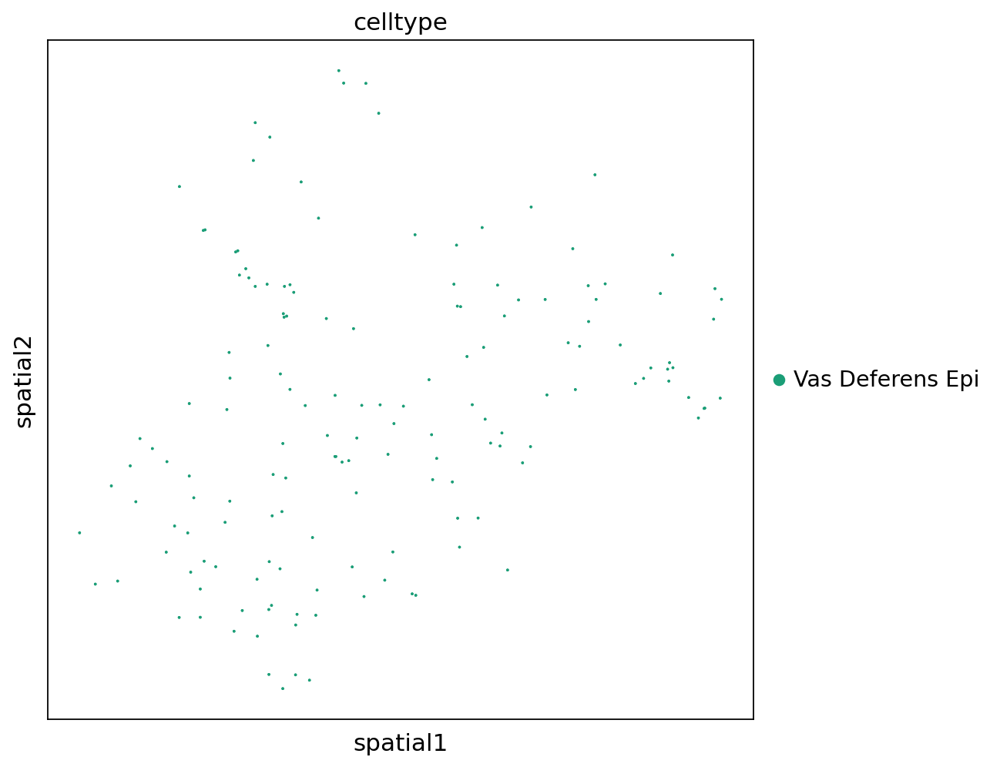

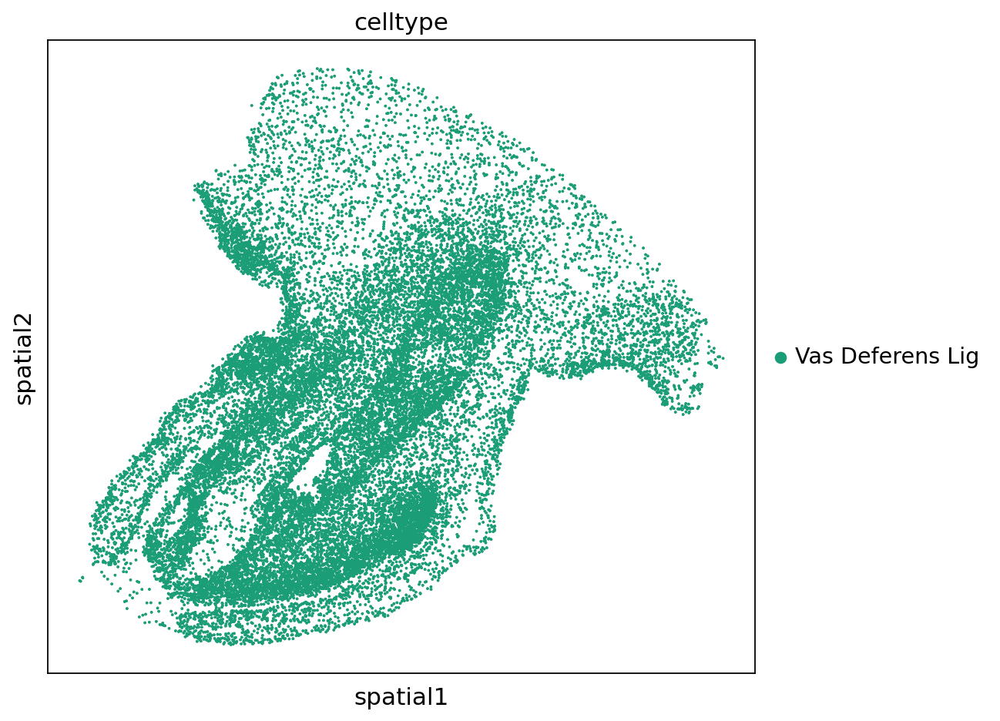

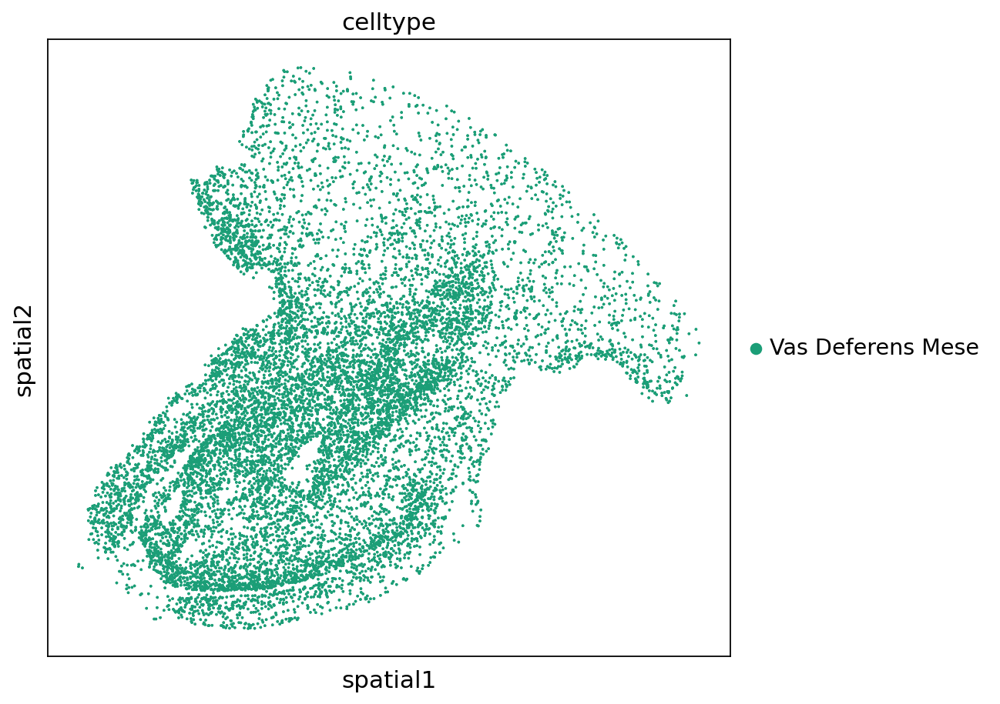

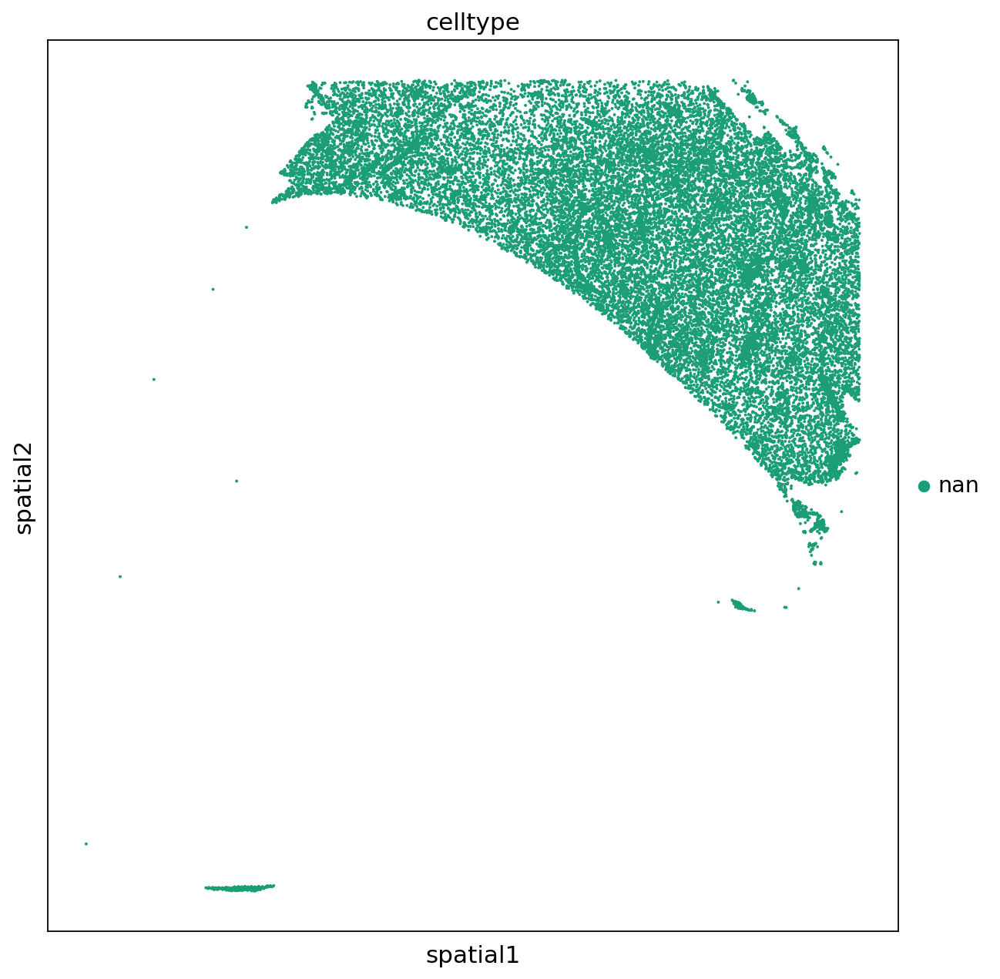

In [41]:
for i in np.unique(CM019.obs['celltype']):
    print(i)
    sq.pl.spatial_scatter(
    CM019,
    spatial_key="spatial",
    color=['celltype'],
    shape=None,
    use_raw = False,
    size=1.5,
    cmap = 'jet',
    figsize=(8,8), 
    legend_loc = 'right margin',
    palette = 'Dark2',
    groups = i
    )

In [75]:
# Create a new column based on conditions
def new_column(row):
    if (row['celltype'] in ['Corpus Cavernosum',
       'Corpus Spongiosum', 'Glans', 'Surface Genital Epi', 'Urethral Epi', 'Preputial Lamina'
      
                            
                             ]) and (row['celltype_fraction'] > 0.3):
        return row['celltype']
    else:
        return np.nan

CM019.obs['ducts'] = CM019.obs.apply(new_column, axis=1)


In [76]:
CM019.obs['ducts'].value_counts(dropna=False)

NaN                    201859
Glans                    7439
Surface Genital Epi      6818
Preputial Lamina         5842
Corpus Cavernosum        4117
Corpus Spongiosum        3130
Urethral Epi             2872
Name: ducts, dtype: int64

In [77]:
CM019.obs['ducts'] = CM019.obs['ducts'].astype(str)

/opt/conda/envs/atac_env/lib/python3.8/site-packages/squidpy/pl/_spatial_utils.py:953: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


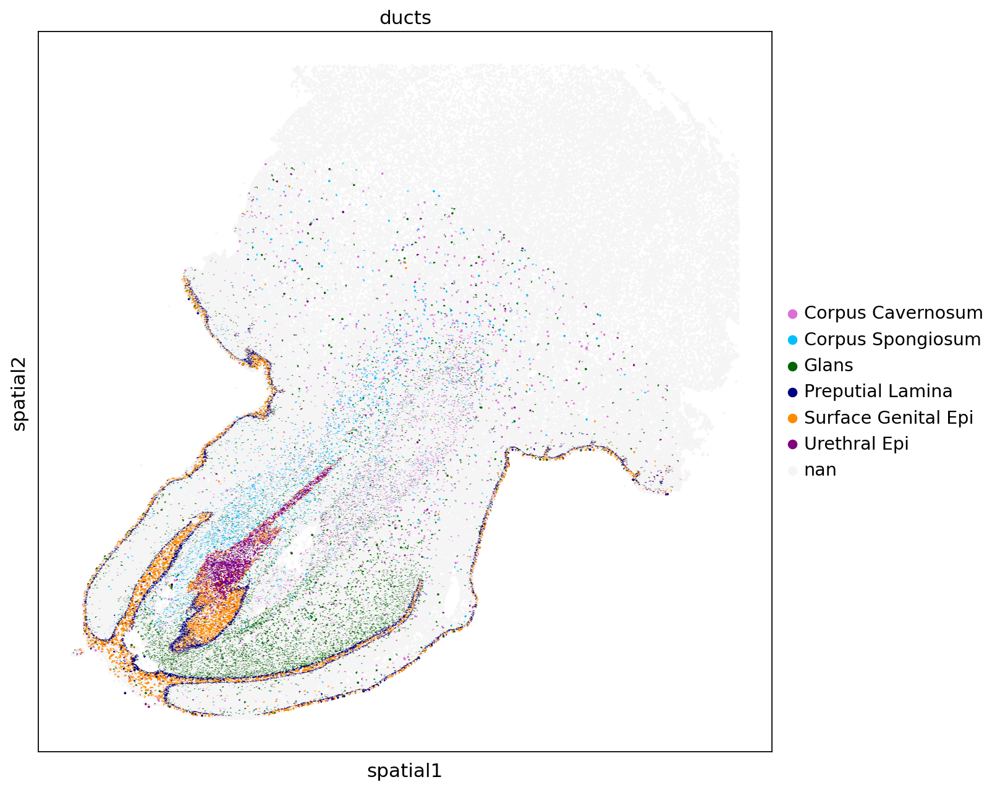

In [80]:
sq.pl.spatial_scatter(
    CM019,
    spatial_key="spatial",
    color=['ducts'],
    shape=None,
    use_raw = False,
    size=1.5,
    cmap = 'jet',
    figsize=(10,10), 
#      legend_loc = 'right margin',
#                      palette= {'Corpus Spongiosum' : 'deepskyblue',  
#                                'Corpus Cavernosum' : 'orchid', 'Surface Genital Epi' : 'darkorange',
#                                'Glans' : 'darkgreen', 'Urethral Epi' : 'purple', 'Preputial Lamina' : 'navy',
         
#         'nan' : 'whitesmoke'
#                               },
    save = 'CM019_ducts_filtered.pdf'
)